# Word Network

For this assignment, I'll use 300-dimensional GloVe word embeddings to induce a network structure. These embeddings were trained on 2014 Wikipedia and are available via Gensim. This notebook offers the result of my exploration of the network structure.

### Preprocessing Of GloVe Embeddings

Let's first get the embeddings from Gensim. We'll get three structures: the array of vectors, the vocabulary, a word2idx dictionary mapping words to their indices and a dictionary mapping the words to their vectors. 

In [3]:
#Downloading the glove embeddings from gensim
import gensim.downloader
glove_model = gensim.downloader.load('glove-wiki-gigaword-300')

#Getting the vocabulary list, array of vectors per word and indices (word2idx)
vocab=glove_model.index_to_key #list
vectors=glove_model.vectors #list of arrays
word2idx = {word: idx for idx, word in enumerate(vocab)} #dictionary: word, index

#creating a dictionary to access the embeddings with word as key and vectors as values
dict_glove = dict({})
for idx, key in enumerate(glove_model.key_to_index):
    dict_glove[key] = glove_model[key]
    
print(f"vectors shape: {vectors.shape}, word2idx length: {len(word2idx)}, vocab length: {len(vocab)}")

vectors shape: (400000, 300), word2idx length: 400000, vocab length: 400000


The following functions clean and limit the above structures to a determined set of the vocabulary

In [4]:
from tqdm import tqdm
import numpy as np

# Function to exclude a list of words from the vocabulary.
# Following the paper: https://github.com/gonenhila/gender_bias_lipstick
def limit_vocab(word_vector, word_index, vocab, exclude = None):
    #vocab_limited=exclude_punctuation(vocab)
    vocab_limited = vocab
    if exclude:
       vocab_limited = list(set(vocab_limited) - set(exclude))

    print("Size of limited vocabulary:", len(vocab_limited))
    
    wv_limited = np.zeros((len(vocab_limited), len(word_vector[0, :])))
    for index,word in enumerate(vocab_limited):
        wv_limited[index,:] = word_vector[word_index[word],:]
    
    w2i_limited = {word: index for index, word in enumerate(vocab_limited)}
    dict_vectors_limit = {word: wv_limited[index,:] for index, word in enumerate(vocab_limited)}
    return vocab_limited, wv_limited, w2i_limited, dict_vectors_limit

#function to determine similarity between word vectors
def cosine_similarity(v, w):
    
    dot_product=np.dot(v,w)
    product_norms=np.linalg.norm(v)*np.linalg.norm(w)
    cosine_similarity = dot_product/product_norms
    
    return cosine_similarity


#getting the keys of selected values in the dictionary
def get_word(i, word2idx_cleaned):
    for key, value in word2idx_cleaned.items():
        if value == i:
            return key

Let's use the functions to get a subset of 1000 words from the embeddings.

In [5]:
vocab_cleaned, vectors_cleaned, word2idx_cleaned, dict_vectors_limit = limit_vocab(vectors, word2idx, vocab, exclude=vocab[1000:])

Size of limited vocabulary: 1000


In [6]:
#get the words that are in the limited vocabulary
print(vocab_cleaned)

['almost', 'price', 'peace', 'served', 'border', 'known', 'technology', 'george', 'hospital', 'off', 'asian', 'go', 'doing', 'vote', 'must', 'forward', 'final', 'outside', 'getting', 'turn', 'car', 'industry', 'players', 'case', 'political', 'groups', 'hard', 'killed', 'opening', 'four', 'took', 'kong', 'works', 'leading', 'taiwan', 'part', 'release', 'brought', 'on', 'whether', 'is', 'involved', 'palestinian', 'video', 'fourth', 'africa', 'shot', 'near', 'too', 'contract', 'become', '_', '$', 'statement', '12', 'senate', 'especially', 'playing', 'billion', 'buy', 'members', 'problem', 'some', 'love', 'created', "'ll", 'left', '!', 'name', 'poor', 'in', 'americans', 'position', 'index', 'list', '1999', 'its', 'show', 'february', 'gas', 'project', 'stage', 'college', 'i', 'ago', 'got', 'vice', 'david', '100', '``', 'see', 'half', 'points', 'private', 'taking', 'street', 'fight', '2012', 'sea', 'built', 'program', 'percent', 'europe', 'currently', 'told', 'turned', 'india', 'help', 'cana

Now, I'll create the Adjacency matrix associated with these words by: 
1. calculating the cosine similarity among all the words in the limited vocabulary. 
2. Inducing the links between words: if the cosine similarity is greater or equal than 0.5 (ie. words are similar), then there will be an edge between the nodes, and thus a 1 on the corresponding position of the adjacency matrix. If not, then the entry in the adjacency matrix will be 0.
3. Removing the values on the diagonal and upper triangle of the resulting matrix to avoid self-loops and double edges

In [7]:
#1. Array of similarities between words
similarities_array=np.array([[cosine_similarity(dict_vectors_limit[x], dict_vectors_limit[y]) for y in vocab_cleaned] for x in vocab_cleaned])
similarities_array.shape

(1000, 1000)

In [8]:
#2.Getting the entries of the adjacency matrix
connections=similarities_array.copy()
connections[connections>=0.5]=1
connections[connections <0.5 ] = 0

#3.Removing the diagonal and the upper triangle to avoid self-loops and multiple edges
connections *= np.tri(*connections.shape)
np.fill_diagonal(connections, 0)

In [51]:
#download the adjacency matrix as a pickle file
import pickle
with open('connections.pkl', 'wb') as f:
    pickle.dump(connections, f)

import pickle
#open the adjacency matrix as a pickle file
#with open('connections.pkl', 'rb') as f:
 #   connections2 = pickle.load(f)
    

In [10]:
#let's look at the resulting adjacency matrix
#sanity check
import pandas as pd

similarities_df = pd.DataFrame(connections.copy())
similarities_df=similarities_df.set_axis([vocab_cleaned], axis=1)
similarities_df=similarities_df.set_axis([vocab_cleaned], axis='index')
similarities_df

,almost,price,peace,served,border,known,technology,george,hospital,off,...,we,using,likely,close,field,named,summer,australian,few,america
almost,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
price,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
peace,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
served,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
border,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
named,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
summer,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
australian,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
few,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


array([[<Axes: title={'center': '0'}>]], dtype=object)

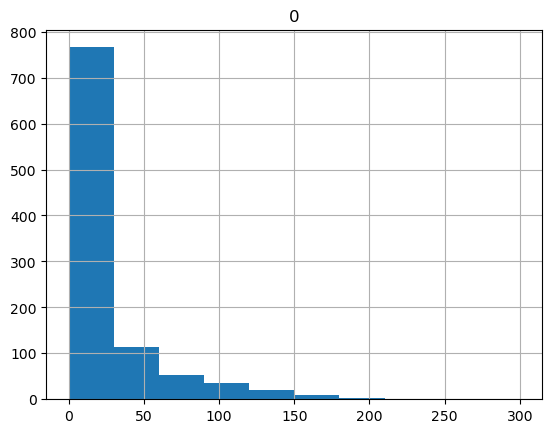

In [11]:
#getting the nodes with more connections
edges=connections.sum(axis=0)
edges=pd.DataFrame(edges).set_axis([vocab_cleaned], axis=0)

#get the distribution of edges on a histogram starting at x=0
edges.hist(bins=10, range=(0, 300))

# A Word Network induced on GloVe Word Embeddings



Importing the required dependencies

In [12]:
import numpy as np
from graph_tool.all import *

objc[75593]: Class GNotificationCenterDelegate is implemented in both /Users/angeladuarte/opt/miniconda3/envs/gt/lib/libgio-2.0.0.dylib (0x19e84ac30) and /usr/local/Cellar/glib/2.76.1/lib/libgio-2.0.0.dylib (0x1cfb866b0). One of the two will be used. Which one is undefined.


Now let's create un undirected graph based on the adjacency matrix: it should have 1000 vertices

In [13]:
#creating the graph from the adjacency matrix as an undirected graph 
g = Graph(np.transpose(np.nonzero(connections)), directed=False)#, #hashed=True)
print(g)


<Graph object, undirected, with 1000 vertices and 21961 edges, at 0x1d02a2b50>


We need a function to map the nodes to their corresponding words: 

In [14]:
vnames = g.new_vertex_property("string")         # vertex names

for i in range(len(vocab_cleaned)):
    vnames[g.vertex(i)] = vocab_cleaned[i]

g.vertex_properties["name"] = vnames

g.list_properties()
g.vertex_properties

name           (vertex)  (type: string)


{'name': <VertexPropertyMap object with value type 'string', for Graph 0x1d02a2b50, at 0x1d02c0550>}

Let's take a look at the graph: 

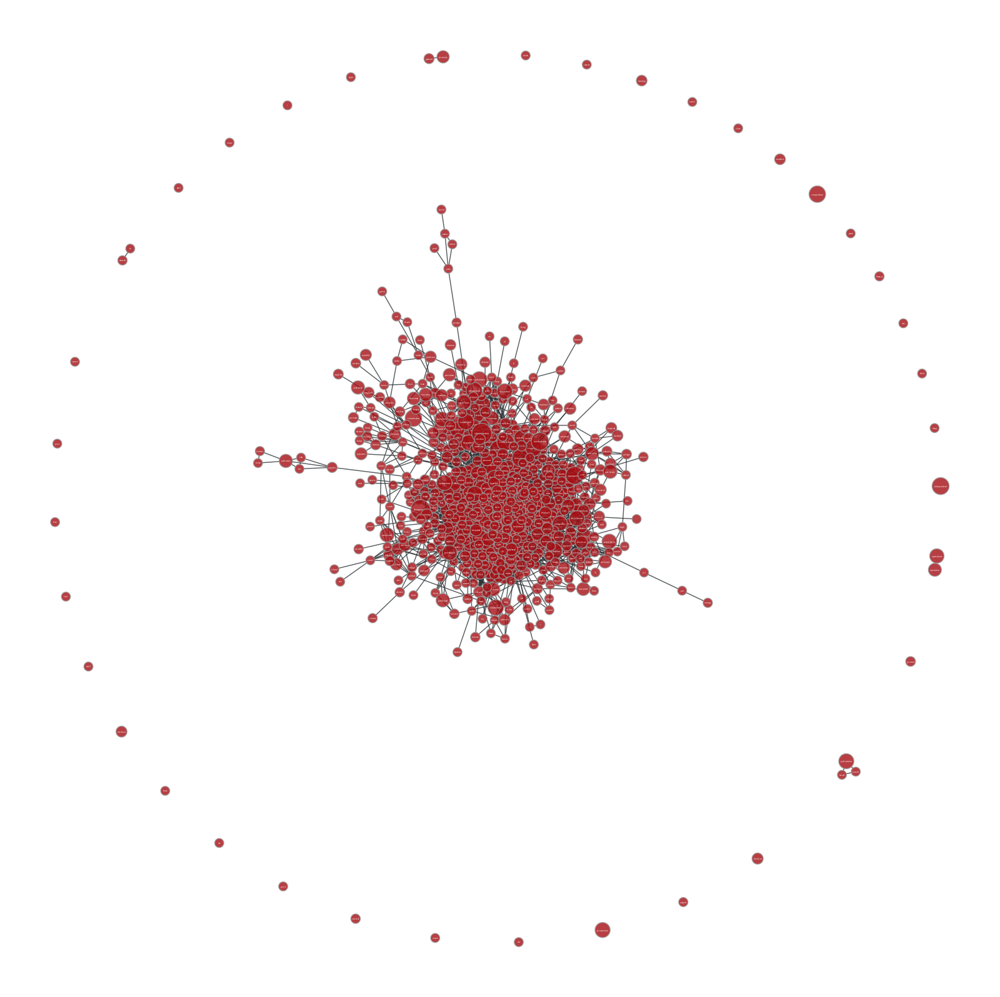

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x1d02a2b50, at 0x19ee1ae10>

In [15]:
graph_draw(g, vertex_text= g.vp.name,
           vertex_font_size=2, output_size=(800, 800)
           )

Interestingly, the words at the edges have no connections to the main connected component, they should correspond to the words that got a 0 cosine-similarity to all other words in the dataset.

## Degree Distribution

In [16]:
import matplotlib.pyplot as plt
import numpy as np
import matplotlib

Let's look at the nodes' degrees to see if they coincide with the edges in the adjacency matrix. The histogram below has the same contour as that of the row-wise sum of the entries in the adjacency matrix. However, nor the values or the exact degrees for the nodes with lower connections coincide. This might be a labelling problem. Therefore, I'll continue the interpretation of the network structure without referencing the word names. 

In [25]:
#looping over nodes to get their names and degrees
degree_list=[]
for v in g.vertices():
    degree_list.append((v.out_degree(), g.vp.name[v]))

#sort the list by degree
degree_list.sort(reverse=True)
print("highest degrees:",degree_list[:20])


highest degrees: [(297, 'but'), (267, 'even'), (265, 'because'), (253, 'they'), (252, 'so'), (247, 'time'), (247, 'that'), (242, 'just'), (238, 'only'), (237, 'not'), (236, 'this'), (232, 'it'), (231, 'what'), (231, 'come'), (228, '.'), (227, 'way'), (226, 'well'), (222, 'same'), (213, 'would'), (213, 'when')]


(array([622., 115.,  76.,  51.,  49.,  45.,  16.,  17.,   8.,   1.]),
 array([  0. ,  29.7,  59.4,  89.1, 118.8, 148.5, 178.2, 207.9, 237.6,
        267.3, 297. ]),
 <BarContainer object of 10 artists>)

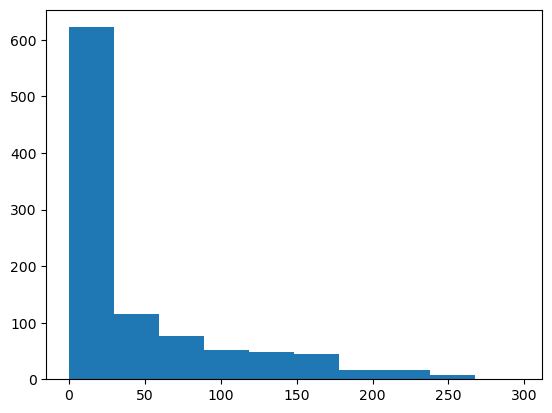

In [26]:
#get the degree distribution on a histogram. Looks very similar to that of the sum of edges in the adjacency matrix
degree_list=[x[0] for x in degree_list]
plt.hist(degree_list, bins=10)

Coming back to the network structure. The word network has a '\<k>=43.92' which means that in average every node has aprox. 44 links or is similar to 44 words. 

In [27]:
mean_k= vertex_average(g, deg='total')
print("<k>:",mean_k[0])

<k>: 43.922


Now, let's take a look at the degree distribution of the network:

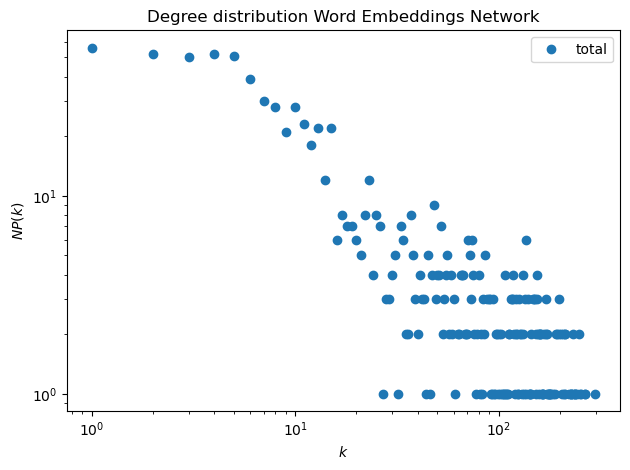

In [30]:
from scipy.stats import poisson

hist = vertex_hist(g, deg="total")

y = hist[0]
#err = np.sqrt(hist[0])
plt.errorbar(hist[1][:-1], hist[0], fmt="o", #yerr=err,
        label="total")
#add title
plt.title("Degree distribution Word Embeddings Network")
plt.yscale("log")
plt.xscale("log")

plt.xlabel("$k$")
plt.ylabel("$NP(k)$")

plt.tight_layout()
plt.legend()

By looking at the degree distribution of the network, it is evident that it does not follow a Poisson distribution and thus does not appear to be an Erdos-Renyi network. It does not follow exactly a power law distribution, either. So, for the next assignment I'll have to check other models to see where it fits.
Finally, from the degree distribution plot, we can tell that a large number of nodes have high degrees, or high number of connections to other nodes. This might signal that rather than hubs, the network might have a large interconnected cluster. 

### Network visualization

First let's extract the largest connected component of the network:


In [31]:
u = extract_largest_component(g)
u = Graph(u,  prune=True)
print(u)
u.list_properties()

<Graph object, undirected, with 958 vertices and 21955 edges, 1 internal vertex property, at 0x1d1217ed0>
name           (vertex)  (type: string)


Now, we'll take a look at the network structure by taking a look at different layouts:

#### 1. SFDP Spring Layout

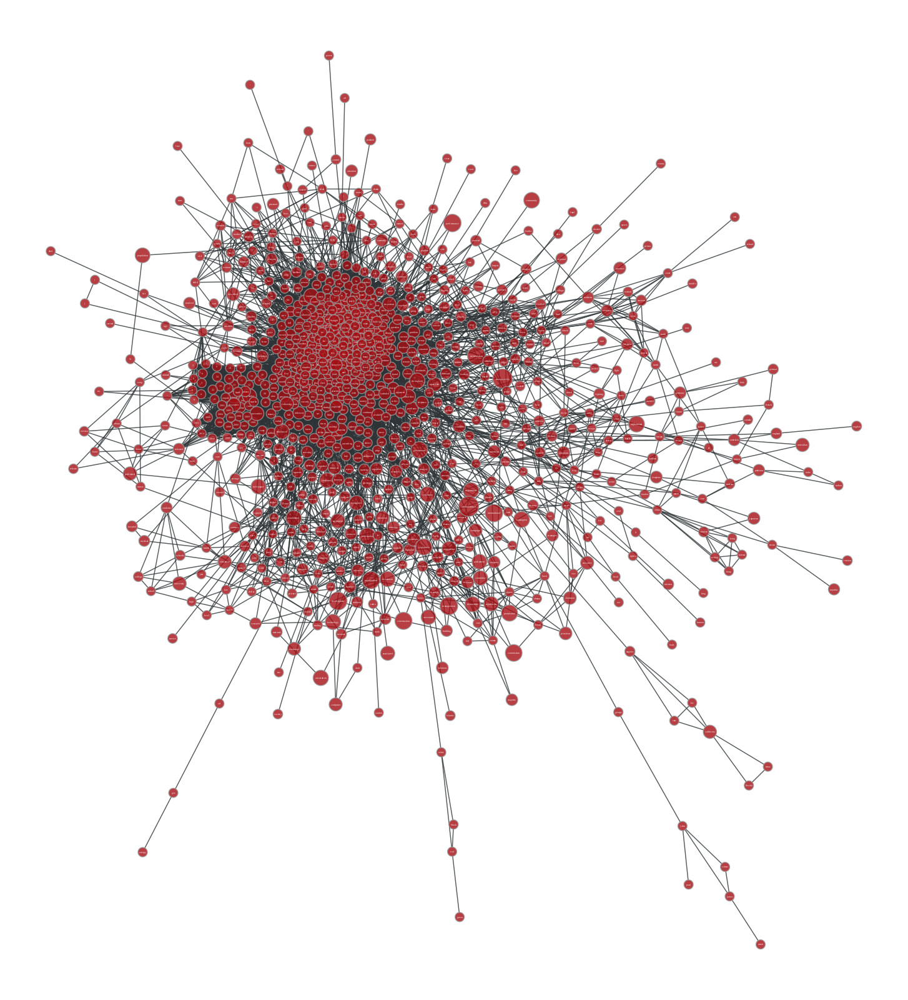

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x1d1217ed0, at 0x1d0fab450>

In [32]:
pos = sfdp_layout(u)
graph_draw(u, pos, vertex_text= u.vp.name, vertex_font_size=2, output_size=(800, 800)
           )

### 2. Fruchterman Reingold Layout

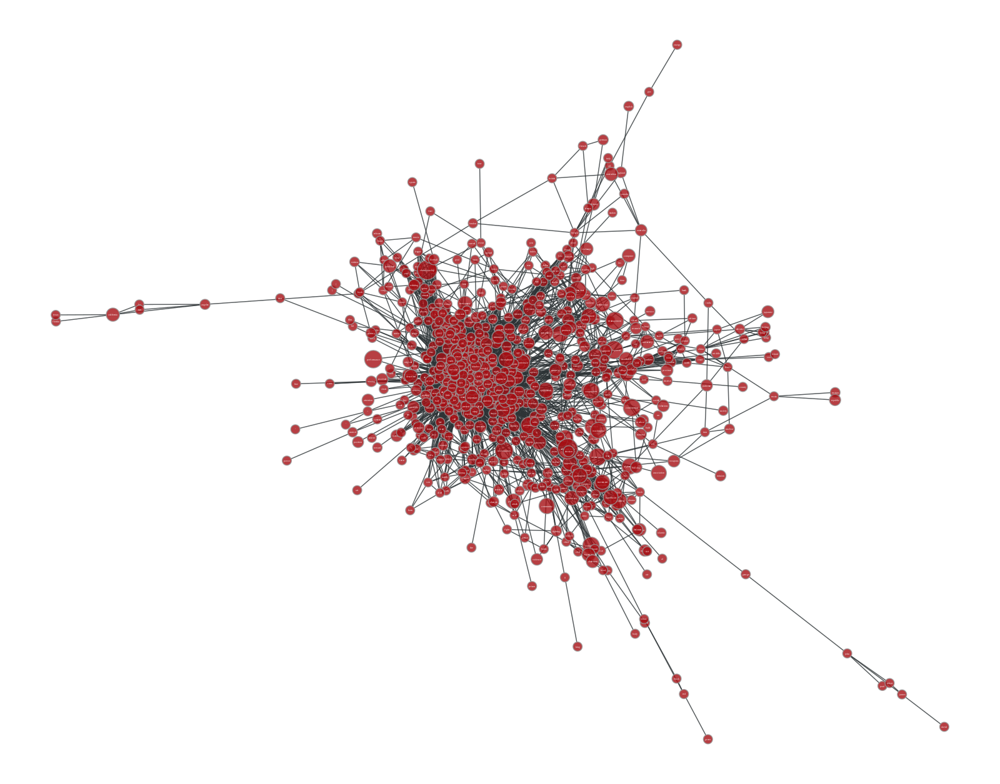

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x1d1217ed0, at 0x1d12cff50>

In [33]:
pos_fr = fruchterman_reingold_layout(u, n_iter=100)
graph_draw(u, pos_fr,vertex_text= u.vp.name, vertex_font_size=2, output_size=(800, 800))

 Because the SFDP Spring Layout and the Fruchterman-Reingold are force-directed graphs, they "attract connected vertices towards each other [...] and, at the same time, push all vertices apart" (Hansen et al., Analizing Social Media Networks with NodeXL, 2020). They then allow to visualize what the most connected subcomponents of the network are. In the word embeddings network, we can see that although there is a great mass of nodes at the center of the network, there seems to be one big cluster and other surrounding connections that could potentially be other clusters (even though the second, smaller cluster, is not so clear on the Fruchterman Reingold layout).



#### 3. Radial tree

This layout doesn't really show a nested hierarchical structure because the center appears to be very crowded, rather than having few nodes at the center and more connections at the next levels of the network. This is not a definite proof that there is no hierarchical structure in the network, though. To get a better sense of the underlying hierarchical structure, I'll take a look later on to block modes.  

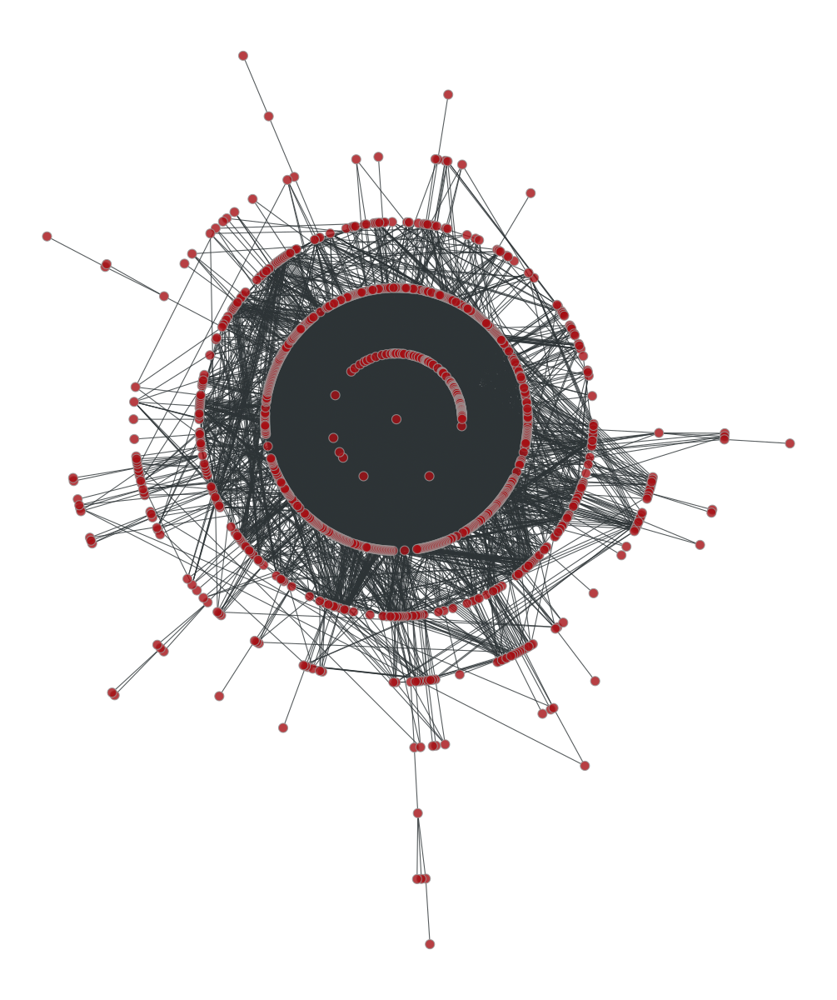

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x1d1217ed0, at 0x1d1365450>

In [34]:
pos_tree = radial_tree_layout(u, 0)
graph_draw(u, pos_tree)

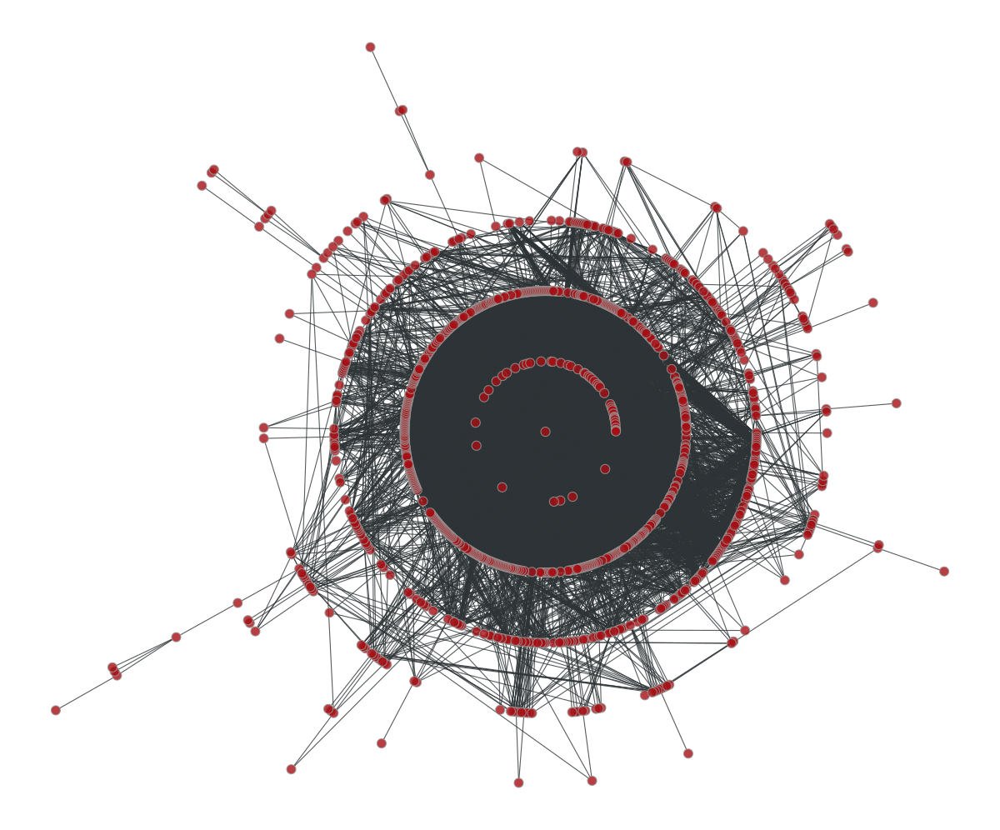

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x1d1217ed0, at 0x1d0d75a90>

In [35]:
maximum = max(u.get_out_degrees(u.get_vertices()))

pos_tree = radial_tree_layout(u, maximum)

graph_draw(u, pos_tree)

#### 4. Nested Block model. 
I will describe this model in more detail in the community detection section. For now, notice that the network appears to have some groups that are strongly connected to each other, while some others appear to have more inter than intra connections, consistent with a hierarchical substructure on the non-clustered level. 

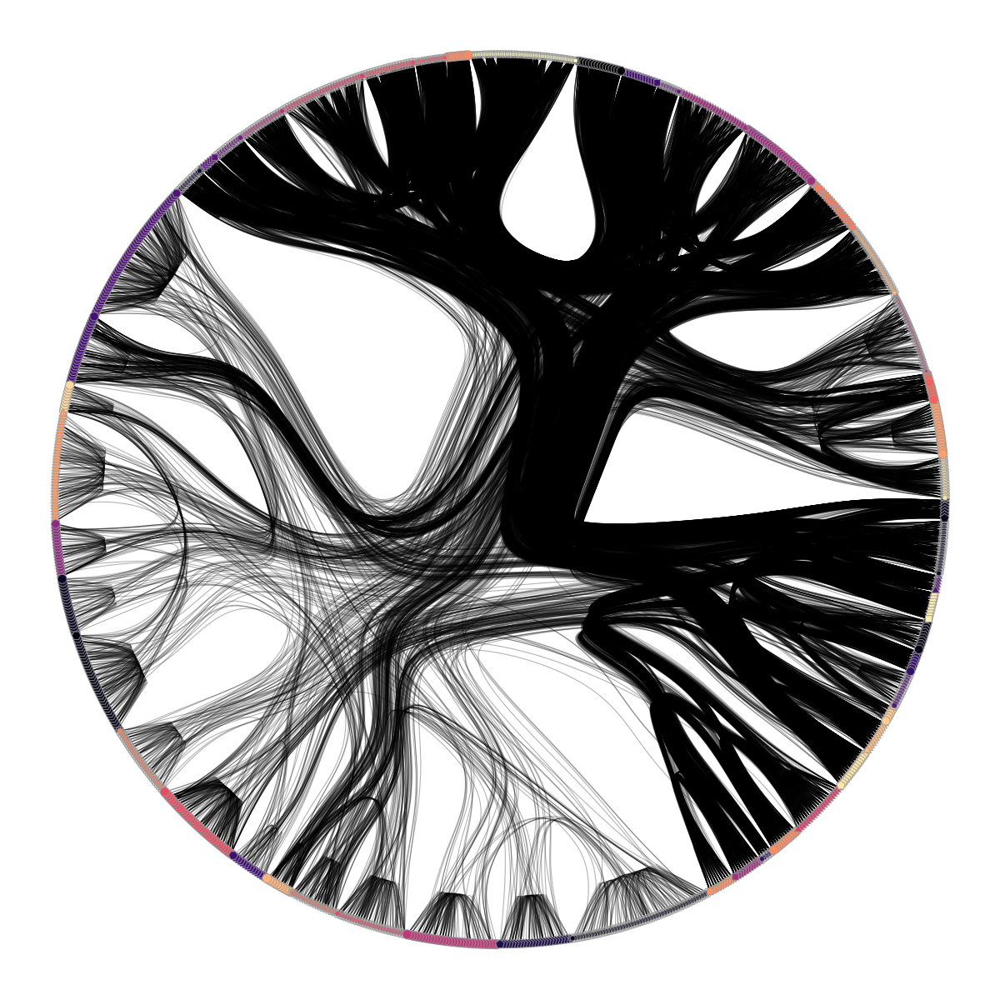

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x1d1217ed0, at 0x1d11d2e90>

In [36]:
state = minimize_nested_blockmodel_dl(u)

t = get_hierarchy_tree(state)[0]

tpos = pos = radial_tree_layout(t, t.vertex(t.num_vertices() - 1, use_index=False), weighted=True)

cts = get_hierarchy_control_points(u, t, tpos)

pos = u.own_property(tpos)

b = state.levels[0].b

shape = b.copy()

shape.a %= 14

graph_draw(u, pos=pos, vertex_fill_color=b, vertex_shape=shape, edge_control_points=cts,

              edge_color=[0, 0, 0, 0.3], vertex_anchor=0)

## Network Distance

### Shortest Distances

The layouts explored before showed that the network is very dense, and there are very few nodes with few connections between them or to the main connected component. This intuition is confirmed when noticing that the average path length is approx 1.65 and the pseudo-diameter is 12, signaling that nodes are likely to be less than 2 edges away from each other and that the longest shortest path is only 12 egdes, small considering that there are 1000 vertices in the network. Furthermore, the distribution of shortest distances between all pairs in the network shows that in fact the majority of shortest paths are between 2 and 4 edges, which then seems close to a normal distribution and supports the intuition of the network having a big dense cluster. 

<BarContainer object of 13 artists>

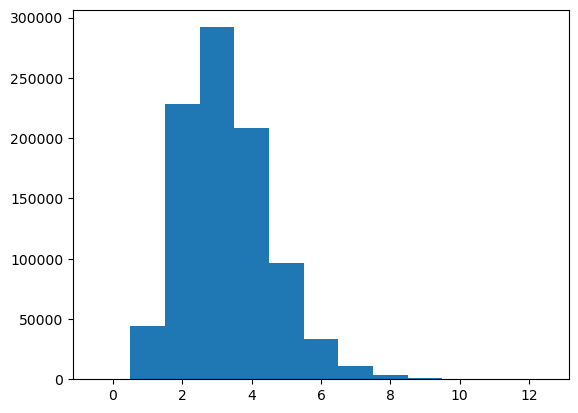

In [37]:
#histogram of shortest distances from all pairs of nodes in the network.  
hist, bin_edges = distance_histogram(u)
#print(hist)
plt.bar(bin_edges[:-1], hist, width=1, align='center')

In [38]:
dist = shortest_distance(u)

average_path_length = vertex_average(u, dist)
print("Average path length is:",np.mean(average_path_length))
print("Pseudo Diameter:",pseudo_diameter(u))

Average path length is: 1.6516010484745979079
Pseudo Diameter: (12.0, (<Vertex object with index '84' at 0x1d14ea640>, <Vertex object with index '905' at 0x1d14ea3c0>))


Similarly, we can calculate the shortest distance from the vertex that has the maximum (as calulated for the radial tree) number of connections to all the other nodes in the network. Then we plot a histogram and see that the highest connected node is very likely to be on 2 or 3-path separation from the rest of the nodes of the network. This might signal that this node is likely to be part of a large cluster of almost fully connected nodes.

(array([  1.,  48., 452., 300., 119.,  27.,   7.,   4.]),
 array([0., 1., 2., 3., 4., 5., 6., 7., 8.]),
 <BarContainer object of 8 artists>)

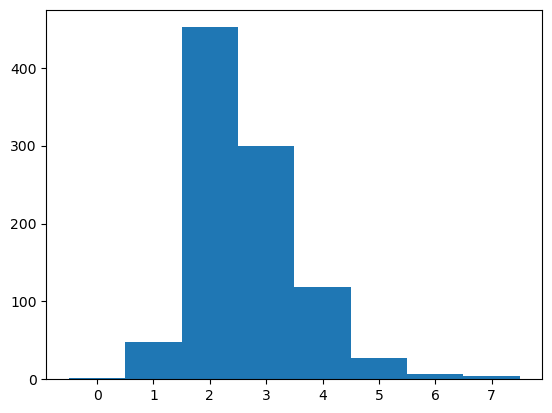

In [39]:
#Histogram of all shortest paths from the node with the highest degree
dist = shortest_distance(u, source=u.vertex(maximum))
plt.hist(list(dist.a) , bins=8, align='left')

## Network Topology

Let's look at some measures to understand the network topology and, more specifically, to who is connected to whom in the connected component.

### Percolation threshold

The percolation treshold describes when the formation of a network becomes almost fully connected. In the figure that follows we can see that the word embeddings network has a steeper growth of the connections than a random network, which signals that it is a super connected network (an impression further supported by the fact that: \< k> > lnN >1).

In [40]:
print('<k>:', mean_k[0])
print('lnN:', np.log(u.num_vertices()))

<k>: 43.922
lnN: 6.86484777797086


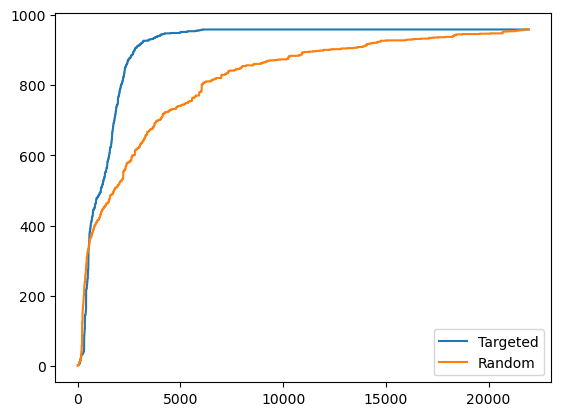

In [41]:
edges = sorted([(e.source(), e.target()) for e in u.edges()],
               key=lambda e: e[0].out_degree() * e[1].out_degree())

sizes, comp = edge_percolation(u, edges)

np.random.shuffle(edges)

sizes2, comp = edge_percolation(u, edges)

plt.plot(sizes, label="Targeted")

plt.plot(sizes2, label="Random")

plt.legend()

### k-core decomposition

So the network appears to be super-connected, but what part of the structure is responsible to this 'super connection'? To find this sub-structure, I run the K-core decomposition algorithm, which removes the connections lesser than k to color only the nodes that have k-connections or more between them. As can be seen in the plot below, from the central connected component only one sub-graph, the denser cluster, has k connections between nodes. It is still quite large due to the super connected nature of the word embeddings network. 

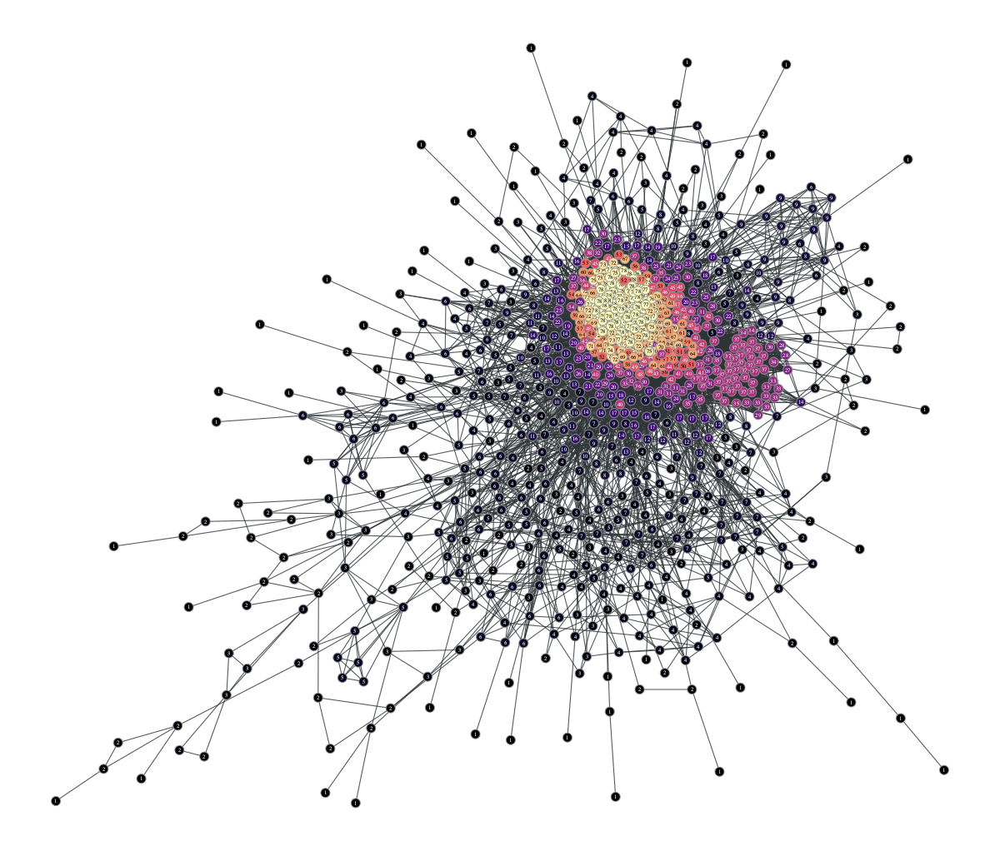

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x1d1217ed0, at 0x1d0fa82d0>

In [42]:
kcore = kcore_decomposition(u)
graph_draw(u, vertex_fill_color=kcore, vertex_text=kcore)

## Centrality Measures

Now, let's look at centrality measures to get an idea of what the importart nodes in the network are. 

1. Closeness centrality measures which are the nodes that are closest to all others by taking an average length of the shortest path between a node and all other nodes in the graph. As can be seen in the plot, the most central nodes are part of the largest cluster as is to be expected. 


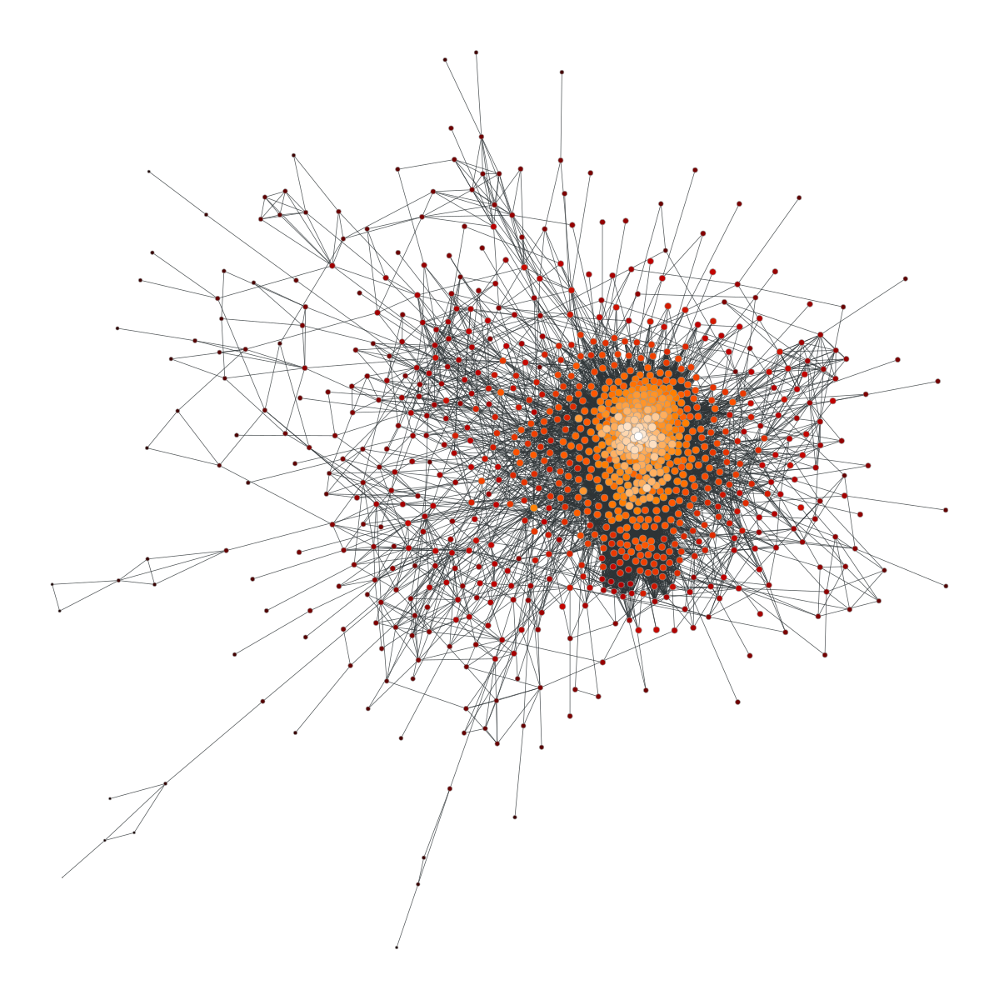

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x1d1217ed0, at 0x1d1c655d0>

In [43]:
c = closeness(u)

graph_draw(u, vertex_fill_color=c,

              vertex_size=prop_to_size(c, mi=0.5, ma=5),

              vcmap=matplotlib.cm.gist_heat,

              vorder=c)

In [52]:
#return index of the node with the highest closeness centrality
print(np.argmax(c.a))
#get the name of the node with the highest closeness centrality
#g.vp.name[np.argmax(c.a)]

140


2. Betweenness centrality: measures how often a node is part of a short connection. The following plot shows that the node that is part of the most short connections is not part of the most connected cluster, but it rather appears to be on the connection between the cluster and the outer areas of the network. 

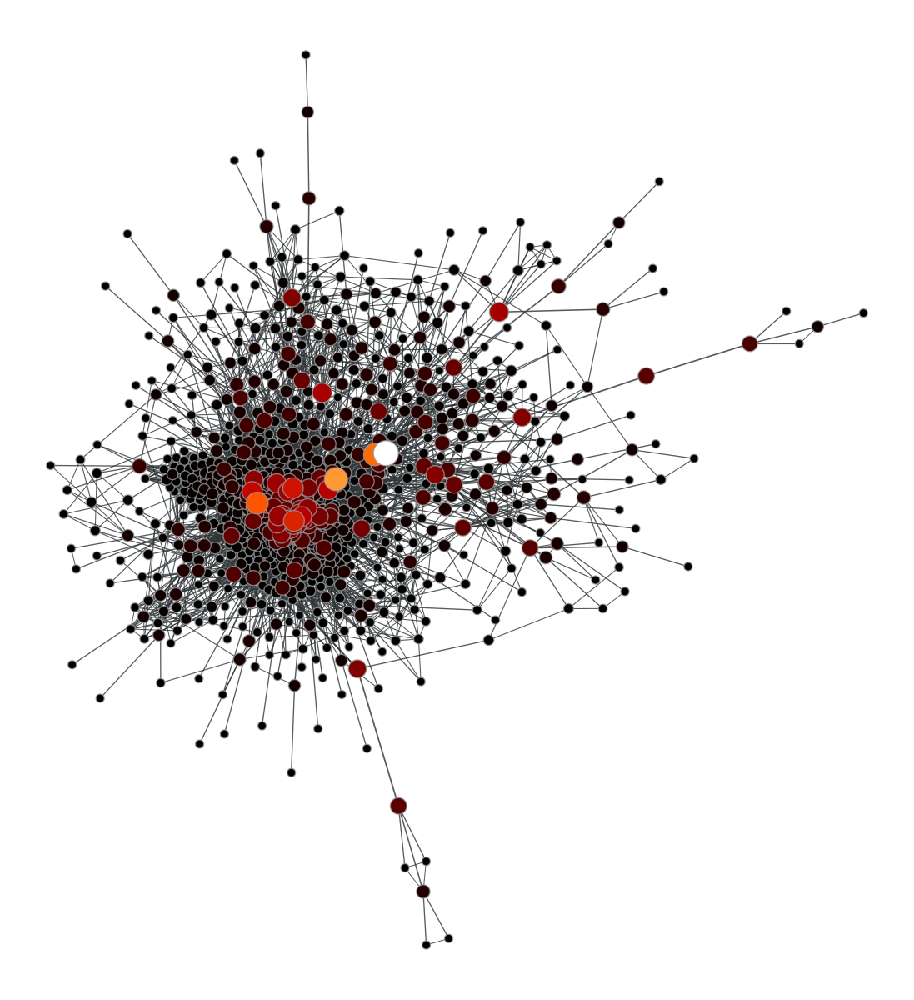

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x1d1217ed0, at 0x1d1ce5050>

In [58]:
vp, ep = betweenness(u)

graph_draw(u, vertex_fill_color=vp,

              vertex_size=prop_to_size(vp, mi=5, ma=15),

              edge_pen_width=prop_to_size(ep, mi=0.5, ma=1),

              vcmap=matplotlib.cm.gist_heat,

              vorder=vp)

In [57]:
#return index of the node with the highest betweenness centrality
print(np.argmax(vp.a))
#get the name of the node with the highest betweenness centrality
#g.vp.name[np.argmax(vp.a)]

584


3. Eigenvector Centrality

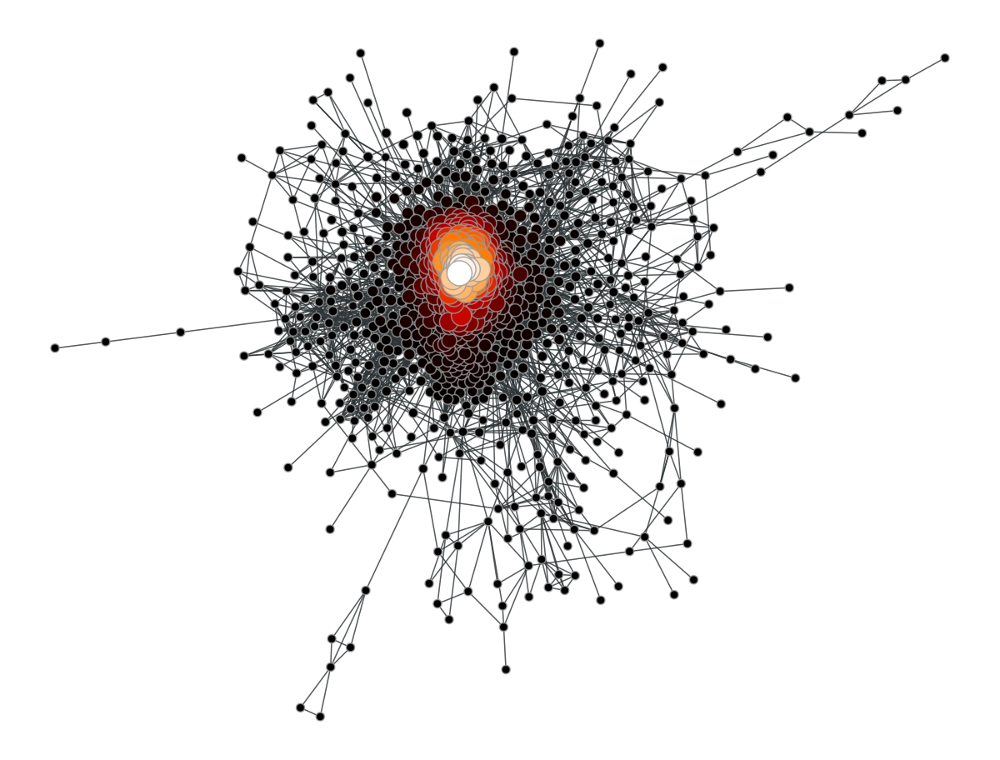

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x1d1217ed0, at 0x1d15d97d0>

In [59]:
ee, x = eigenvector(u)

graph_draw(u, vertex_fill_color=x,

              vertex_size=prop_to_size(x, mi=5, ma=15),

              vcmap=matplotlib.cm.gist_heat,

              vorder=x)

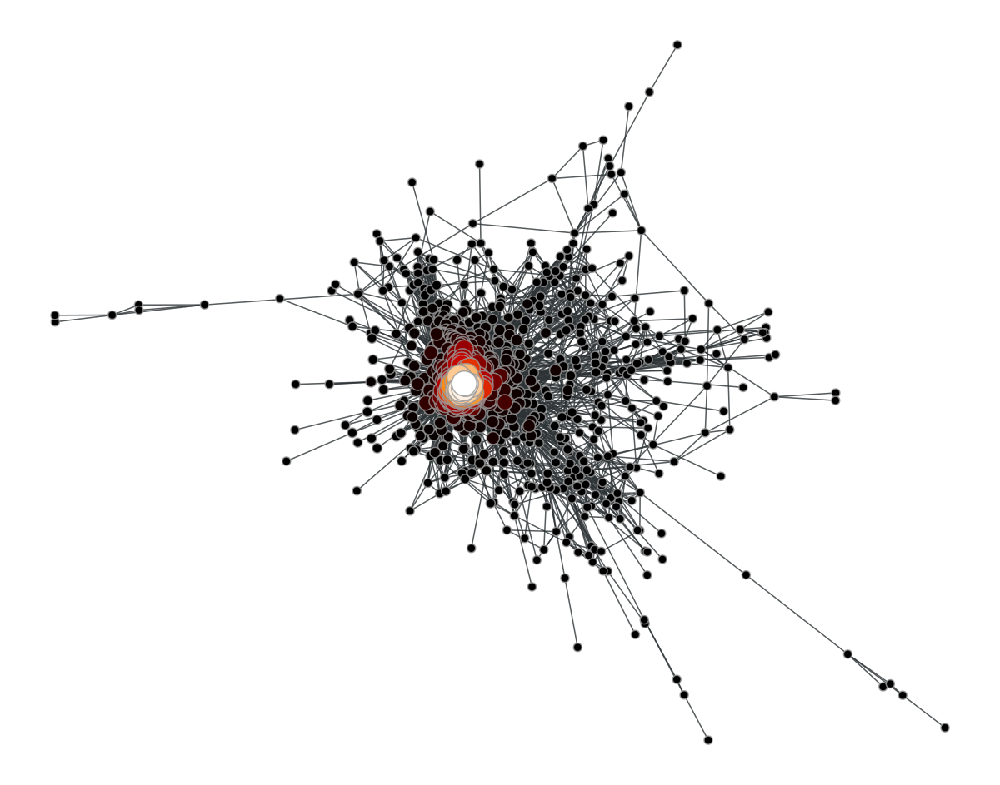

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x1d1217ed0, at 0x1d1440a50>

In [60]:
graph_draw(u, pos=pos_fr, vertex_fill_color=x,

              vertex_size=prop_to_size(x, mi=5, ma=15),

              vcmap=matplotlib.cm.gist_heat,

              vorder=x)

In [64]:
#return index of the node with the highest eigenvector centrality
print(np.argmax(x.a))
#get the name of the node with the highest eigenvector centrality
#g.vp.name[np.argmax(x.a)]

140


4. Page Rank Centrality

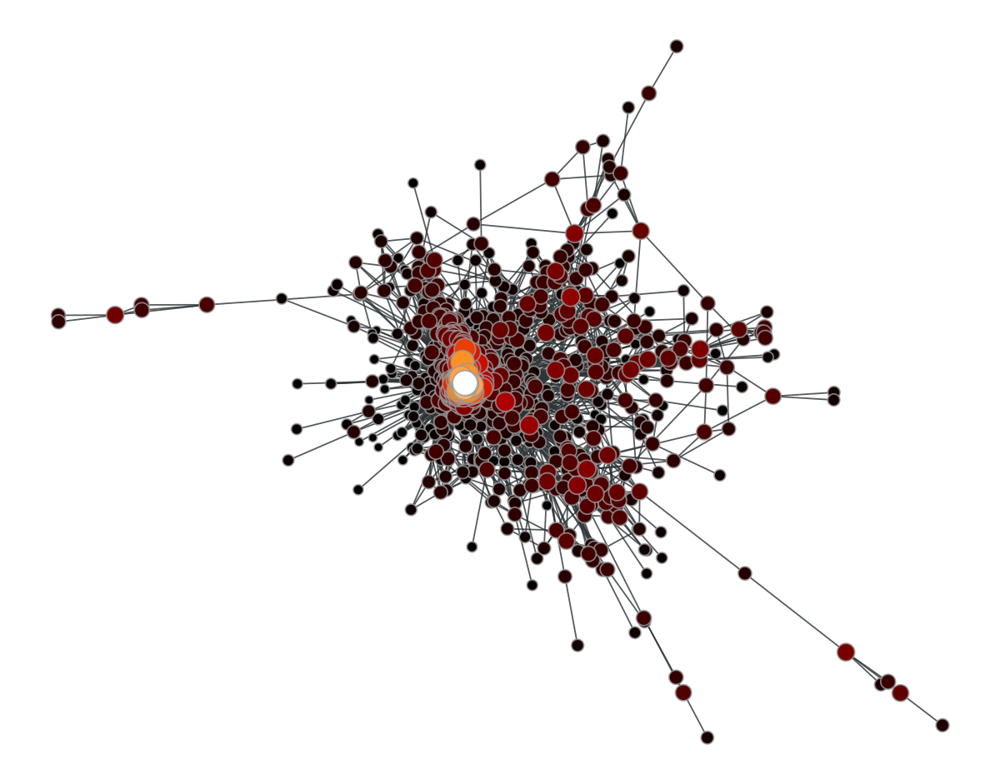

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x1d1217ed0, at 0x1d12c6850>

In [65]:
pr = pagerank(u)

graph_draw(u,pos_fr, vertex_fill_color=pr, 

              vertex_size=prop_to_size(pr, mi=5, ma=15),

              vorder=pr, vcmap=matplotlib.cm.gist_heat)

In [66]:
#return index of the node with the highest pagerank centrality
print(np.argmax(pr.a))
#get the name of the node with the highest pagerank centrality
#g.vp.name[np.argmax(pr.a)]

140


Both 3. Eigenvector centrality and 4. PageRank centrality measure the centrality of the nodes based on the centrality of their neighbors. Both get roughly the same set of nodes, which means that there is a cluster of high degree nodes connected to other high-degree nodes. They seem to be centered on vertex 140, as the closeness centrality also seems to suggest.


## Clustering

So, the network is super-connected, but how is the local clustering? The local clustering coefficient shows that the probability of two neighboring nodes being connected to one another is 50%, which shows that there is high conectivity among neighbors. By looking at the scatter plot below, we can further refine the intuition by noticing that lower degree nodes have higher variation of the local clustering coefficient, but it tends to converge to about 0.4 when the degree increases. This shows that more connected nodes tend to be on connected nets of neighbors, further confirming the super-connectivity of the main cluster of this word network.

In [67]:
clust = local_clustering(u)

print(vertex_average(u, clust))

(0.4886849401403362, 0.008207087560742054)


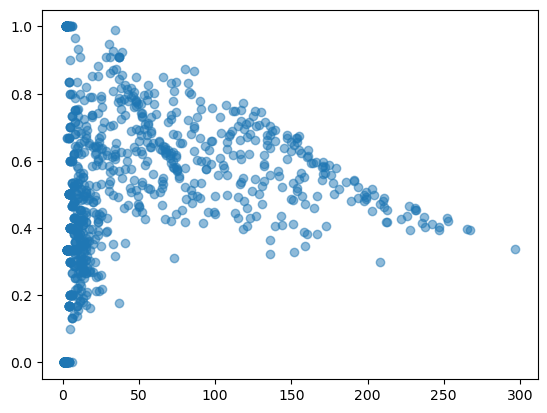

In [68]:
degs = u.get_total_degrees(u.get_vertices())

plt.scatter(degs, clust.a, alpha=0.5, label='degrees') 

## Community detection

Finally, I will use stochastic block models to see whether there are communities in the network. From the first block model, we can infer that the network does indeed have blocks, but these are not clearly separable. In fact, they seem to overlap at the center, despite having clearer –but not entirely separated blocks– on the outskirts of the figure. This means that the network does not really have communities, as the relation between words tends not to be limited to specific contexts, but can range across different semantic fields. 

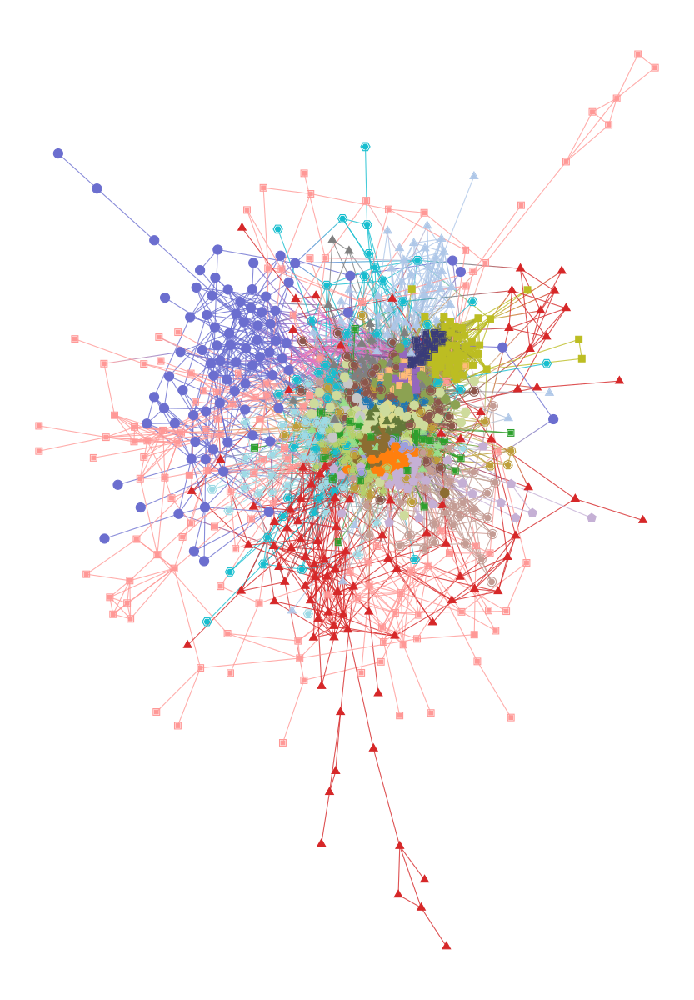

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x1d1217ed0, at 0x1d0dd8b10>

In [69]:
state = minimize_blockmodel_dl(u)

state.draw(vertex_shape=state.get_blocks())

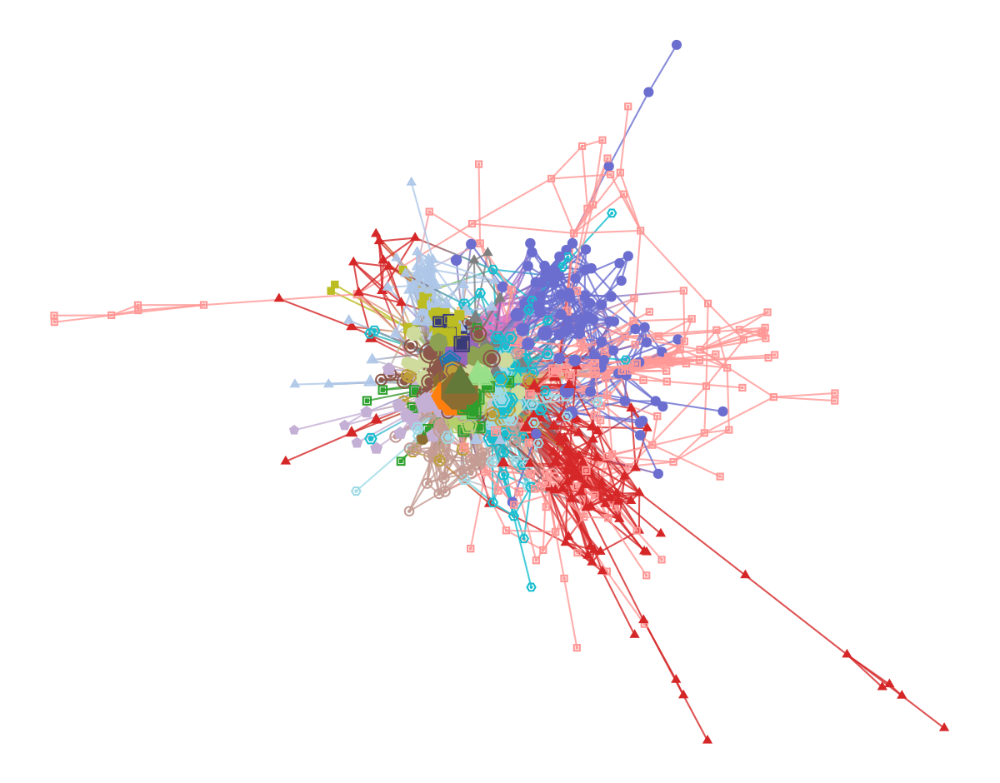

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x1d1217ed0, at 0x1d12a2fd0>

In [70]:
state.draw(pos=pos_fr, vertex_shape=state.get_blocks(), vertex_size=prop_to_size(x, mi=5, ma=25))


In [100]:
b = state.get_blocks()
r = b[maximum]   # group membership of vertex 10
print(list(b))


[457, 534, 457, 935, 599, 572, 201, 617, 908, 68, 33, 572, 643, 457, 68, 67, 114, 809, 68, 534, 643, 935, 681, 617, 599, 806, 120, 201, 68, 599, 617, 681, 623, 193, 457, 193, 688, 67, 457, 935, 457, 908, 599, 607, 351, 68, 809, 623, 68, 617, 457, 68, 68, 120, 806, 623, 46, 908, 386, 688, 457, 457, 46, 809, 68, 457, 67, 68, 734, 457, 68, 44, 457, 68, 806, 68, 643, 599, 617, 68, 806, 935, 688, 46, 68, 68, 599, 201, 809, 193, 120, 46, 809, 607, 617, 457, 617, 331, 351, 806, 228, 331, 681, 33, 935, 617, 457, 68, 457, 44, 46, 809, 681, 535, 46, 68, 643, 68, 46, 935, 935, 617, 201, 68, 935, 534, 935, 662, 643, 908, 457, 535, 607, 201, 68, 908, 68, 46, 68, 882, 935, 806, 44, 734, 806, 68, 935, 67, 806, 68, 935, 68, 228, 193, 33, 617, 643, 809, 599, 681, 572, 457, 908, 68, 809, 809, 68, 193, 593, 607, 114, 457, 33, 68, 386, 68, 593, 457, 68, 457, 228, 547, 806, 68, 33, 46, 688, 68, 46, 351, 593, 688, 193, 331, 908, 935, 734, 534, 33, 457, 201, 688, 572, 643, 809, 534, 457, 457, 201, 593, 386, 

Finally, with the nested block model (below), we can see that the network doesn't appear to have a community structure, but rather a complex cluster and sub-hierarchical graphs structure: 

1. In the plot, the blocks that have a stronger color appear to have both inter and intra connections, which means that they are connected internally and to other similar blocks (as shown with the similar coloring). This interconnection of blocks signals that there is indeed a large cluster of words of different groups that have mutual interconnections, which could signal that lexical fields are not disjoint but often intersect and overlap.  
2. However, the most interesting fact is that there is evidence of a hierarchical substructure within the network: at least where the colors are lighter in the plot below, the nodes that belong to a group have more intra-connections rather than connections to other groups.

I'll have to dig deeper into the structure in the next assignment to uncover the hierarchical structure of this network. 

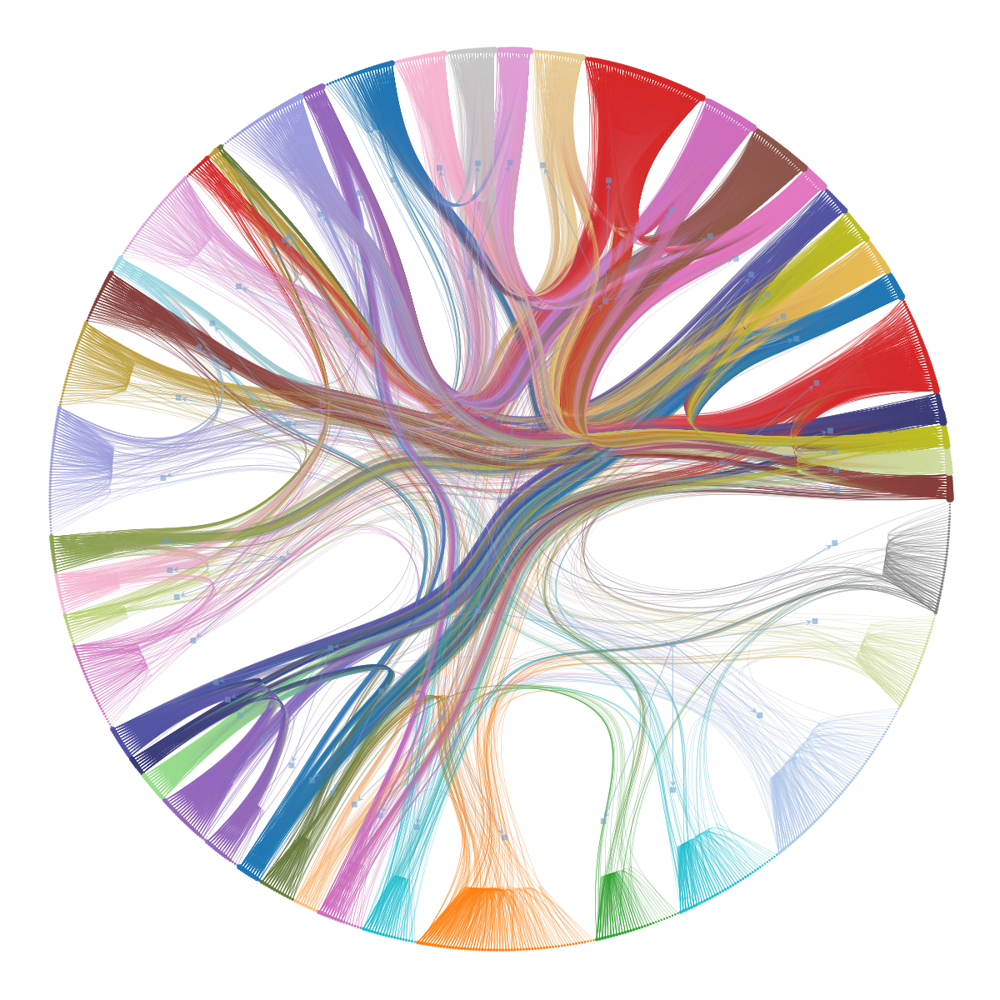

(<VertexPropertyMap object with value type 'vector<double>', for Graph 0x1d1217ed0, at 0x1d12c5550>,
 <GraphView object, directed, with 1023 vertices and 1022 edges, edges filtered by (<EdgePropertyMap object with value type 'bool', for Graph 0x1d13cfbd0, at 0x1d1c85910>, False), vertices filtered by (<VertexPropertyMap object with value type 'bool', for Graph 0x1d13cfbd0, at 0x1d1d1d4d0>, False), at 0x1d13cfbd0>,
 <VertexPropertyMap object with value type 'vector<double>', for Graph 0x1d13cfbd0, at 0x1d1cc2dd0>)

In [73]:
state2 = minimize_nested_blockmodel_dl(u)

state2.draw()

In [74]:
state2.print_summary()

l: 0, N: 958, B: 48
l: 1, N: 48, B: 12
l: 2, N: 12, B: 4
l: 3, N: 4, B: 1
l: 4, N: 1, B: 1


In [75]:
u.save("embeddings.graphml")

## Summary of findings


As seen in this exploration, the network induced from a subset of 1000 GloVe word embeddings has a super-connected structure that is heavily clustered on high-degree nodes. This shows that it is not a Erdos-Renyi network, but it does not entirely follow the Albert-Barabasi structure (more work has to be done to prove this point).

There is little evidence of hubs, but there is rather a dense connection of high-degree nodes, consistent with a big cluster where most of the connections occur. Of the higher connected nodes, the node 140 seems to be very central because it is very close to all other nodes of the network and because of the high centrality of its neighbors. However, it is not the node with highest betweenness, which signals that the connections between the cluster and the outer section of the graph might go through a different structure. 

Perhaps consistently with the nature of language, there is no evidence of a community structure. There are (semantic?) blocks that overlap and intersect. Among them, there are relations that point to a big cluster in the network and also some other blocks that seem to have a hierarchical substructure, maybe related to lexical fields.  
